In [5]:
import pickle 
import pandas as pd
import pandas as pd 
import glob
import os
import numpy as np
#import demoji
import seaborn as sns
import nltk
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from nltk.tokenize import RegexpTokenizer
from matplotlib import pyplot as plt



In [33]:
!pip install wordcloud

In [34]:
import os

from os import path
from wordcloud import WordCloud

In [7]:
file = "copy_merged_datasetpickle.pkl"
twitter_df = pd.read_pickle(file)

In [8]:
twitter_df.head()

,external_author_id,author,content,region,language,publish_date,following,followers,updates,is_retweet,account_category,tweet_id,full_url,data_source,has_URL,emoji_text,emoji_count
0,906000000000000000,10_GOP,"""We have a sitting Democrat US Senator on tria...",Unknown,English,2017-10-01 19:58:00,1052,9636,253,0,RightTroll,914580356430536707,https://twitter.com/10_gop/status/914580356430...,Troll,1,[],0
1,906000000000000000,10_GOP,Marshawn Lynch arrives to game in anti-Trump s...,Unknown,English,2017-10-01 22:43:00,1054,9637,254,0,RightTroll,914621840496189440,https://twitter.com/damienwoody/status/9145685...,Troll,1,[],0
2,906000000000000000,10_GOP,Daughter of fallen Navy Sailor delivers powerf...,Unknown,English,2017-10-01 22:50:00,1054,9637,255,1,RightTroll,914623490375979008,https://twitter.com/10_gop/status/913231923715...,Troll,1,[],0
3,906000000000000000,10_GOP,JUST IN: President Trump dedicates Presidents ...,Unknown,English,2017-10-01 23:52:00,1062,9642,256,0,RightTroll,914639143690555392,https://twitter.com/10_gop/status/914639143690...,Troll,1,[],0
4,906000000000000000,10_GOP,"19,000 RESPECTING our National Anthem! #StandF...",Unknown,English,2017-10-01 02:13:00,1050,9645,246,1,RightTroll,914312219952861184,https://twitter.com/realDonaldTrump/status/914...,Troll,1,[flag: United States],1


In [9]:
tokenizer = RegexpTokenizer(r'\w+')


In [10]:
author_words = twitter_df.apply(lambda x: (x['author'],tokenizer.tokenize(x['content'])), axis = 1 )

In [11]:
author_words

0         (10_GOP, [We, have, a, sitting, Democrat, US, ...
1         (10_GOP, [Marshawn, Lynch, arrives, to, game, ...
2         (10_GOP, [Daughter, of, fallen, Navy, Sailor, ...
3         (10_GOP, [JUST, IN, President, Trump, dedicate...
4         (10_GOP, [19, 000, RESPECTING, our, National, ...
                                ...                        
493181    (MichelleObama, [Sign, up, for, this, Saturday...
493182    (MichelleObama, [A, full, life, means, giving,...
493183    (MichelleObama, [RT, BarackObama, Happy, birth...
493184    (MichelleObama, [RT, FLOTUS, The, FLOTUS, Offi...
493185    (MichelleObama, [The, First, Lady, invites, yo...
Length: 2610052, dtype: object

In [12]:
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Johns\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Johns\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [13]:
author_words_dict = {}

In [14]:
for x in twitter_df['author'].unique(): 
    author_words_dict[x] = []

In [15]:
# for x in author_words_dict.keys():
#     for j in author_words: 
#         if x == j[0]: 
#             for w in j[1]: 
#                 if not w.lower() in stop_words: 
#                     author_words_dict[x].append(w)

In [16]:
# with open('authors_words.pickle', 'wb') as handle:
#     pickle.dump(author_words_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [17]:
with open('authors_words.pickle', 'rb') as handle:
    author_words = pickle.load(handle)

In [18]:
author_words


{'10_GOP': ['sitting',
  'Democrat',
  'US',
  'Senator',
  'trial',
  'corruption',
  'barely',
  'heard',
  'peep',
  'mainstream',
  'media',
  'nedryun',
  'https',
  'co',
  'gh6g0D1oiC',
  'Marshawn',
  'Lynch',
  'arrives',
  'game',
  'anti',
  'Trump',
  'shirt',
  'Judging',
  'sagging',
  'pants',
  'shirt',
  'say',
  'Lynch',
  'vs',
  'belt',
  'https',
  'co',
  'mLH1i30LZZ',
  'Daughter',
  'fallen',
  'Navy',
  'Sailor',
  'delivers',
  'powerful',
  'monologue',
  'anthem',
  'protests',
  'burns',
  'NFL',
  'packers',
  'gear',
  'BoycottNFL',
  'https',
  'co',
  'qDlFBGMeag',
  'President',
  'Trump',
  'dedicates',
  'Presidents',
  'Cup',
  'golf',
  'tournament',
  'trophy',
  'people',
  'Florida',
  'Texas',
  'Puerto',
  'Rico',
  'https',
  'co',
  'z9wVa4djAE',
  '19',
  '000',
  'RESPECTING',
  'National',
  'Anthem',
  'StandForOurAnthem',
  'https',
  'co',
  'czutyGaMQV',
  'Dan',
  'Bongino',
  'Nobody',
  'trolls',
  'liberals',
  'better',
  'Donald

In [19]:
#WC = WordCloud(stopwords=stop_words,max_words=25,background_color="white").generate(author_words)

In [20]:
all_words = []

In [21]:
for x in author_words.values(): 
    for j in x: 
        all_words.append(j)

In [39]:
all_words

['sitting',
 'Democrat',
 'US',
 'Senator',
 'trial',
 'corruption',
 'barely',
 'heard',
 'peep',
 'mainstream',
 'media',
 'nedryun',
 'https',
 'co',
 'gh6g0D1oiC',
 'Marshawn',
 'Lynch',
 'arrives',
 'game',
 'anti',
 'Trump',
 'shirt',
 'Judging',
 'sagging',
 'pants',
 'shirt',
 'say',
 'Lynch',
 'vs',
 'belt',
 'https',
 'co',
 'mLH1i30LZZ',
 'Daughter',
 'fallen',
 'Navy',
 'Sailor',
 'delivers',
 'powerful',
 'monologue',
 'anthem',
 'protests',
 'burns',
 'NFL',
 'packers',
 'gear',
 'BoycottNFL',
 'https',
 'co',
 'qDlFBGMeag',
 'President',
 'Trump',
 'dedicates',
 'Presidents',
 'Cup',
 'golf',
 'tournament',
 'trophy',
 'people',
 'Florida',
 'Texas',
 'Puerto',
 'Rico',
 'https',
 'co',
 'z9wVa4djAE',
 '19',
 '000',
 'RESPECTING',
 'National',
 'Anthem',
 'StandForOurAnthem',
 'https',
 'co',
 'czutyGaMQV',
 'Dan',
 'Bongino',
 'Nobody',
 'trolls',
 'liberals',
 'better',
 'Donald',
 'Trump',
 'Exactly',
 'https',
 'co',
 'AigV93aC8J',
 'https',
 'co',
 'MorL3AQW0z',
 'S

In [23]:
data_analysis = nltk.FreqDist(all_words)

In [24]:
word_count = {k: v for k, v in sorted(data_analysis.items(), key=lambda item: item[1], reverse=True)}

In [25]:
word_count

{'co': 2367119,
 'https': 1994462,
 'http': 389310,
 'RT': 181576,
 'Trump': 181415,
 'news': 136767,
 'amp': 84081,
 'Obama': 56647,
 '2': 54550,
 'people': 51585,
 'sports': 50509,
 'U': 49975,
 'like': 48162,
 'New': 45423,
 'world': 45358,
 'says': 43560,
 'new': 43420,
 'politics': 43082,
 '1': 42013,
 'get': 40852,
 'Hillary': 40703,
 'Clinton': 39045,
 'one': 38391,
 'via': 37667,
 'workout': 37423,
 'police': 35100,
 '3': 34605,
 'man': 34009,
 'time': 32942,
 'us': 32420,
 'BREAKING': 31623,
 'US': 31571,
 'know': 30155,
 'local': 29750,
 'President': 29501,
 'America': 29384,
 'year': 29048,
 'need': 27723,
 'Police': 27203,
 '4': 26563,
 'make': 26217,
 'today': 25913,
 'say': 25520,
 'Man': 25350,
 'would': 25340,
 'day': 25102,
 'go': 24944,
 '5': 24714,
 'back': 24446,
 'want': 23821,
 'first': 23551,
 'see': 23274,
 'Black': 23176,
 'good': 22955,
 'health': 22759,
 'life': 22311,
 'American': 22247,
 'may': 21569,
 'realDonaldTrump': 21373,
 'State': 21345,
 'years': 21

In [26]:
pd.DataFrame(word_count.items(), columns=['Word', 'Count']).head(20)

,Word,Count
0,co,2367119
1,https,1994462
2,http,389310
3,RT,181576
4,Trump,181415
5,news,136767
6,amp,84081
7,Obama,56647
8,2,54550
9,people,51585


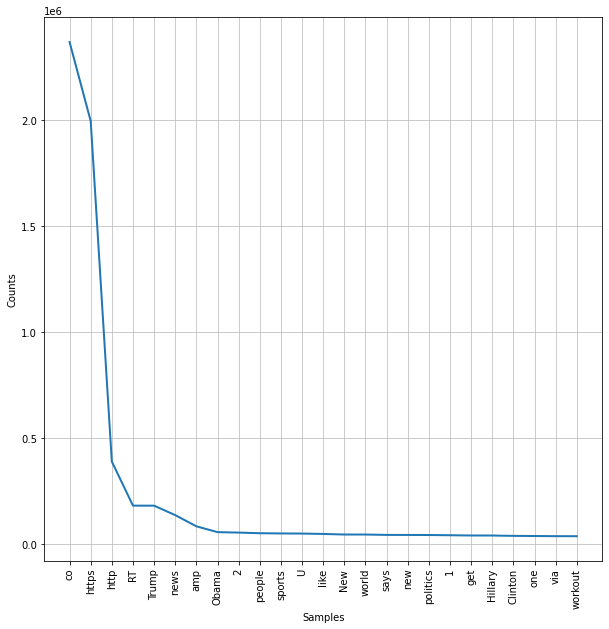

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [27]:
plt.figure(figsize=(10,10))
data_analysis.plot(25, cumulative=False)

In [38]:
author_words_dict

{'10_GOP': [],
 '1D_NICOLE_': [],
 '1ERIK_LEE': [],
 '1LORENAFAVA1': [],
 '2NDHALFONION': [],
 '4EVER1937': [],
 '4EVER_SUSAN': [],
 '4MYSQUAD': [],
 '5EMEN5EMENICH': [],
 '5L5_5L5': [],
 '666STEVEROGERS': [],
 '6DRUZ': [],
 '71BILALJAMIL1': [],
 'AAASSSSSHHH': [],
 'AAAVADAKEDAVRAA': [],
 'AAGN1AA': [],
 'AANTIRACIST': [],
 'AARONALLENALL': [],
 'AARON_M1TCHELL': [],
 'ABALAKOVAYLIA': [],
 'ABBYLOPTRT': [],
 'ABELLABAB': [],
 'ABIGAILCALLME': [],
 'ABIGAILSSILK': [],
 'ABIISSROSB': [],
 'ABISADMASST': [],
 'ABMERRLINS': [],
 'ABOUTPOLIT': [],
 'ABRAMSREBEKAH': [],
 'ABUNUWASA': [],
 'ACAB_ZONE': [],
 'ACAPARELLA': [],
 'ACEJINEV': [],
 'ACHSAHORKHAN': [],
 'ACTIVEMIKR': [],
 'ADALESTRTM': [],
 'ADAMCHAPMANJR': [],
 'ADAMMA_DEFOND': [],
 'ADAM_MATHISSS': [],
 'ADDIE_HOL': [],
 'ADELE_BROCK': [],
 'ADELIINESTRT': [],
 'ADELINE_GS': [],
 'ADELISTRTT': [],
 'ADKEZLATE': [],
 'ADLEESTTT': [],
 'ADLEESWOD': [],
 'ADNNELSTR': [],
 'ADRGREERR': [],
 'ADRIANAMFTTT': [],
 'ADRIASNSS': [],
 'ADR

In [53]:
author_specific = []
for k, v in author_words.items():
    if k == '2NDHALFONION':
        for j in v:
            author_specific.append(j)

In [54]:
string_text = ' '.join(author_specific)    
wordcloud = WordCloud(width=1600, height=800).generate(string_text)

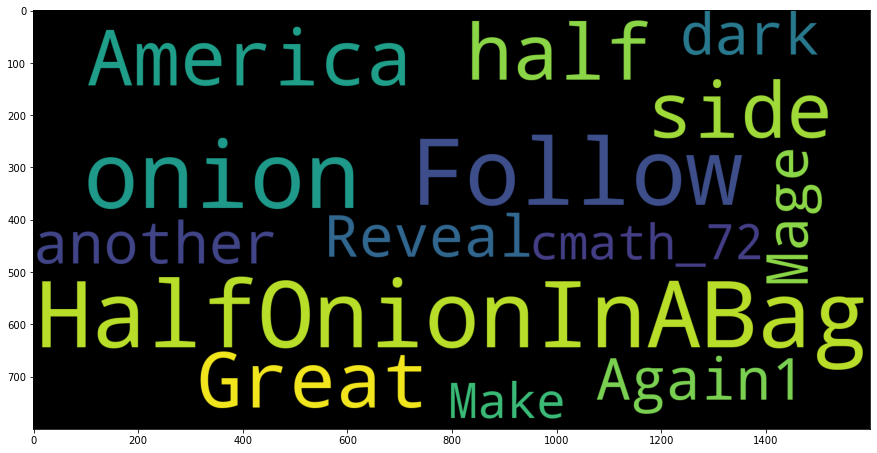

In [55]:
plt.figure(figsize=(15,10))
plt.clf()
plt.imshow(wordcloud)
plt.show()

In [31]:
pos_tagged = nltk.pos_tag(author_words)

LookupError: 
**********************************************************************
  Resource [93maveraged_perceptron_tagger[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('averaged_perceptron_tagger')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mtaggers/averaged_perceptron_tagger/averaged_perceptron_tagger.pickle[0m

  Searched in:
    - 'C:\\Users\\Johns/nltk_data'
    - 'c:\\ProgramData\\Anaconda3\\nltk_data'
    - 'c:\\ProgramData\\Anaconda3\\share\\nltk_data'
    - 'c:\\ProgramData\\Anaconda3\\lib\\nltk_data'
    - 'C:\\Users\\Johns\\AppData\\Roaming\\nltk_data'
    - 'C:\\nltk_data'
    - 'D:\\nltk_data'
    - 'E:\\nltk_data'
**********************************************************************


In [44]:
length = [len(x) for x in all_words]

In [48]:
length.value_counts()

AttributeError: 'list' object has no attribute 'value_counts'

In [50]:
from collections import Counter
counts = Counter(length)

In [51]:
counts

Counter({7: 2836413,
         8: 1987715,
         2: 3169460,
         5: 5822867,
         10: 3206132,
         6: 3085864,
         4: 4200011,
         3: 2045426,
         9: 1306239,
         17: 38134,
         15: 225680,
         13: 310954,
         11: 527424,
         1: 415529,
         12: 387407,
         19: 25598,
         16: 56746,
         14: 222499,
         25: 6900,
         18: 24774,
         22: 10829,
         24: 6268,
         21: 18623,
         20: 25251,
         23: 15596,
         27: 3363,
         29: 1368,
         26: 5662,
         28: 3671,
         33: 2269,
         31: 137,
         30: 139,
         32: 65,
         36: 35,
         38: 11,
         34: 56,
         46: 3,
         48: 1,
         41: 13,
         42: 7,
         40: 4,
         47: 3,
         43: 39,
         35: 22,
         57: 2,
         39: 19,
         52: 2,
         62: 3,
         68: 1,
         45: 14,
         97: 2,
         37: 15,
         60: 1,
         5

In [52]:
pd.DataFrame(counts.items(), columns=['Length', 'Count']).head(20)

,Length,Count
0,7,2836413
1,8,1987715
2,2,3169460
3,5,5822867
4,10,3206132
5,6,3085864
6,4,4200011
7,3,2045426
8,9,1306239
9,17,38134
